In [1]:
import tensorflow as tf 
import numpy as np
import matplotlib.pyplot as plt
import os
import random
import matplotlib.image as mpimg

In [2]:
data_dir = os.getcwd() + '/fruits-360-smaller/'
train_dir = data_dir + 'Training/'
test_dir = data_dir + 'Test/'
multi_test_dir = data_dir+'test-multiple_fruits/'

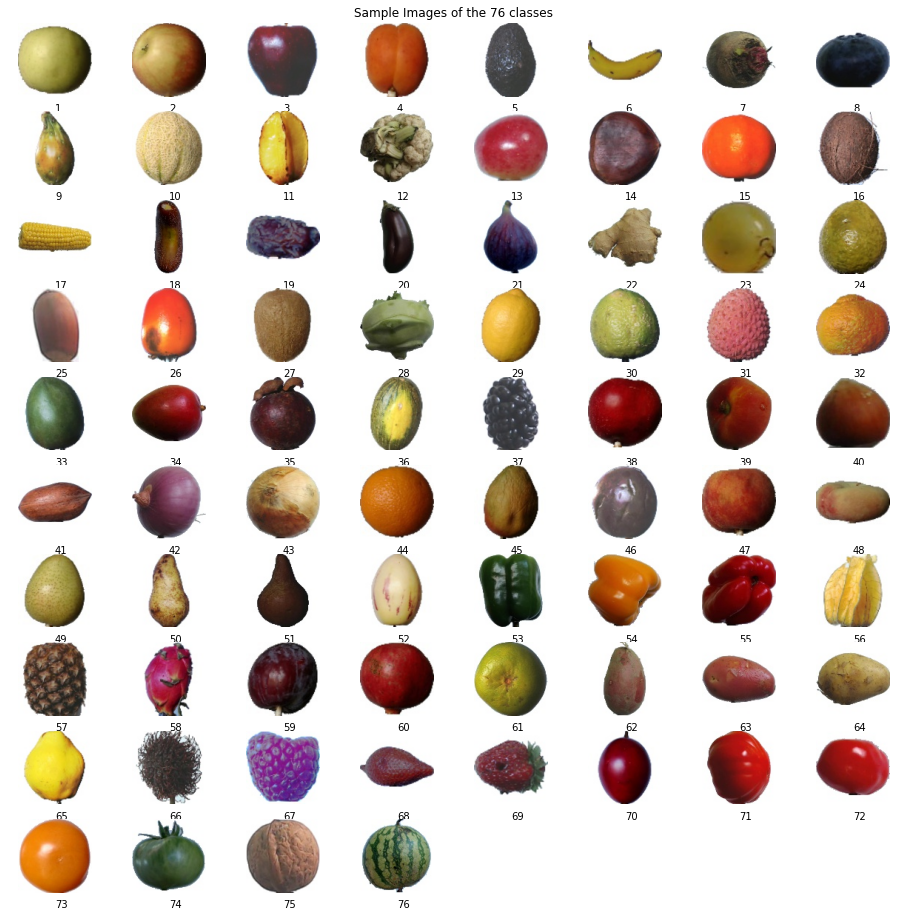

In [3]:
classes = os.listdir(train_dir)
classes.sort()
images = []
classesSize = []
for folder in classes:
    imageFiles = os.listdir(train_dir+folder)
    images.append(train_dir+folder+'/'+imageFiles[0])
    classesSize.append(len(imageFiles))
fig = plt.figure(figsize=(16,16))
plt.title(label='Sample Images of the '+str(len(classes))+' classes')
plt.axis('off')
for i, img in enumerate(images):
    fig.add_subplot(10,8,i+1)
    image = mpimg.imread(img)
    plt.imshow(image)
    plt.text(x = 50, y =120, s=str(i+1))
    plt.axis('off')

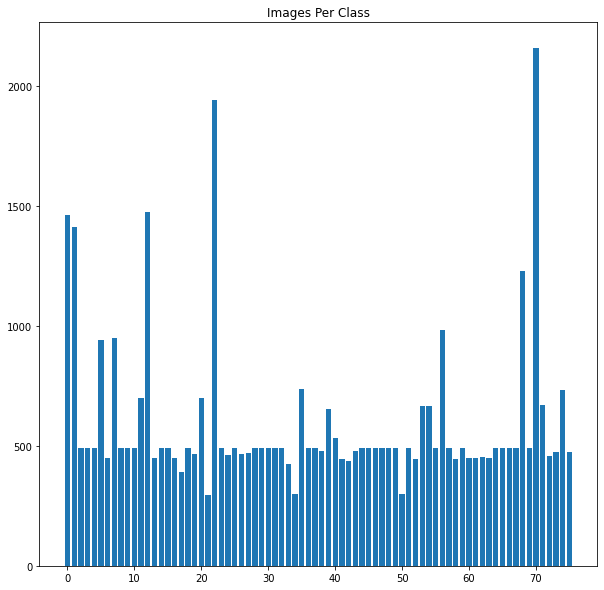

In [4]:
plt.figure(figsize=(10,10))
plt.bar(x=range(len(classes)), height= classesSize, )
plt.title(label='Images Per Class')
plt.show()

In [4]:
def plotData(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    epochs = np.arange(0,len(acc)*5, 5)
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    fig = plt.figure(figsize=(10,5))

    fig.add_subplot(1,2,1)
    plt.title('Accuracy over Epochs')
    plt.plot(epochs, acc, label='Train Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.ylim(bottom=0)
    plt.legend()
    plt.ylabel('Accuracy')
    plt.xlabel('Epochs')

    fig.add_subplot(1,2,2)
    plt.title('Loss over Epochs')
    plt.plot(epochs, loss, label='Train Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.ylim(bottom=0)
    plt.legend()
    plt.ylabel('Loss')
    plt.xlabel('Epochs')

In [5]:
def visuallyInspect(model):
    uploads = random.choices(os.listdir(test_dir), k = 20)
    size = len(uploads)
    fig = plt.figure(figsize=(50,50))
    for i, file in enumerate(uploads):
        path = test_dir + file
        path = path +'/'+ random.choice(os.listdir(path))
        img = tf.keras.preprocessing.image.load_img(path, target_size=(100, 100))
        img = tf.keras.preprocessing.image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        saved = mpimg.imread(path)
        fig.add_subplot(10,10,i+1)
        plt.imshow(saved)
    
        plt.axis('off')
        pred = model.predict(img)
        plt.text(x=0, y=0, s=classes[np.argmax(pred)],fontsize=20)

In [6]:
def classDisribution(model):
    classList = os.listdir(test_dir)
    classList.sort()
    accuracy = []
    for i, folder in enumerate(classList):
        folderList = os.listdir(test_dir+folder)
        imgs = []
        for file in folderList:
            img = tf.keras.preprocessing.image.load_img(test_dir+folder+'/'+file, target_size=(100,100))
            img = tf.keras.preprocessing.image.img_to_array(img)
            imgs.append(img)
        imgs = np.stack(imgs, axis=0)
        predictions = np.argmax(model.predict(imgs), axis=1)
        correct = float(np.sum(predictions == i))*100
        accuracy.append(correct/len(folderList))
    plt.figure(figsize=(15,10))
    plt.bar(x=list(range(1,77)), height = accuracy)
    plt.show()

In [7]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1.0/255)
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1.0/255)
train_gen = train_datagen.flow_from_directory(train_dir, class_mode='categorical', batch_size = 200, target_size=(100,100), shuffle=True)
test_gen = test_datagen.flow_from_directory(test_dir, class_mode='categorical', batch_size=300, target_size=(100,100), shuffle=True)

Found 45704 images belonging to 76 classes.
Found 15340 images belonging to 76 classes.


In [9]:
small_model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=16, kernel_size=3, data_format='channels_last', input_shape=(100,100,3), padding='same'),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding='same'),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding='valid'),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=512),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dense(units=76),
    tf.keras.layers.Activation('softmax'),
])
small_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [10]:
checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath='76_class_models/small_model.hdf5', monitor='val_loss', verbose=1, save_best_only=True)
learningRateDecay = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, verbose=1)

In [11]:
history = small_model.fit(train_gen, steps_per_epoch=135, epochs=50, verbose=1, callbacks=[checkpointer, learningRateDecay], validation_data=test_gen, validation_freq=1, shuffle=True)

Epoch 1/50
135/135 [==============================] - ETA: 0s - loss: 0.9252 - accuracy: 0.7735
Epoch 00001: val_loss improved from inf to 0.30954, saving model to 76_class_models/small_model.hdf5
135/135 [==============================] - 13s 95ms/step - loss: 0.9252 - accuracy: 0.7735 - val_loss: 0.3095 - val_accuracy: 0.9324 - lr: 0.0010
Epoch 2/50
135/135 [==============================] - ETA: 0s - loss: 0.0321 - accuracy: 0.9916
Epoch 00002: val_loss improved from 0.30954 to 0.28611, saving model to 76_class_models/small_model.hdf5
135/135 [==============================] - 12s 92ms/step - loss: 0.0321 - accuracy: 0.9916 - val_loss: 0.2861 - val_accuracy: 0.9388 - lr: 0.0010
Epoch 3/50
135/135 [==============================] - ETA: 0s - loss: 0.0057 - accuracy: 0.9993
Epoch 00003: val_loss improved from 0.28611 to 0.22319, saving model to 76_class_models/small_model.hdf5
135/135 [==============================] - 12s 92ms/step - loss: 0.0057 - accuracy: 0.9993 - val_loss: 0.2232

In [12]:
small_model = tf.keras.models.load_model('76_class_models/small_model.hdf5')
small_model.evaluate(test_gen)

52/52 [==============================] - 5s 87ms/step - loss: 0.1663 - accuracy: 0.9731


[0.16634564101696014, 0.9730769395828247]

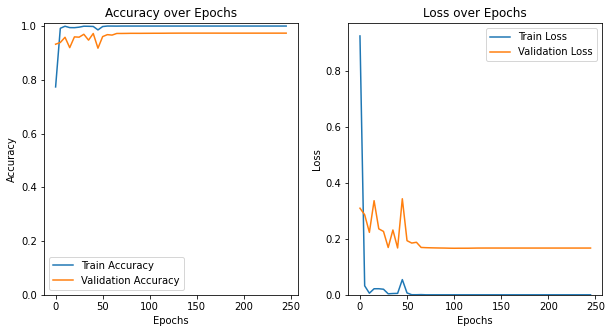

In [13]:
plotData(history)

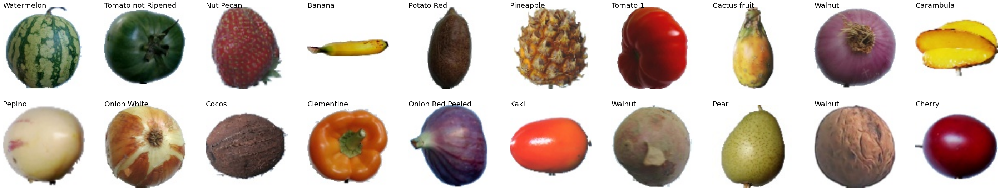

In [14]:
visuallyInspect(small_model)

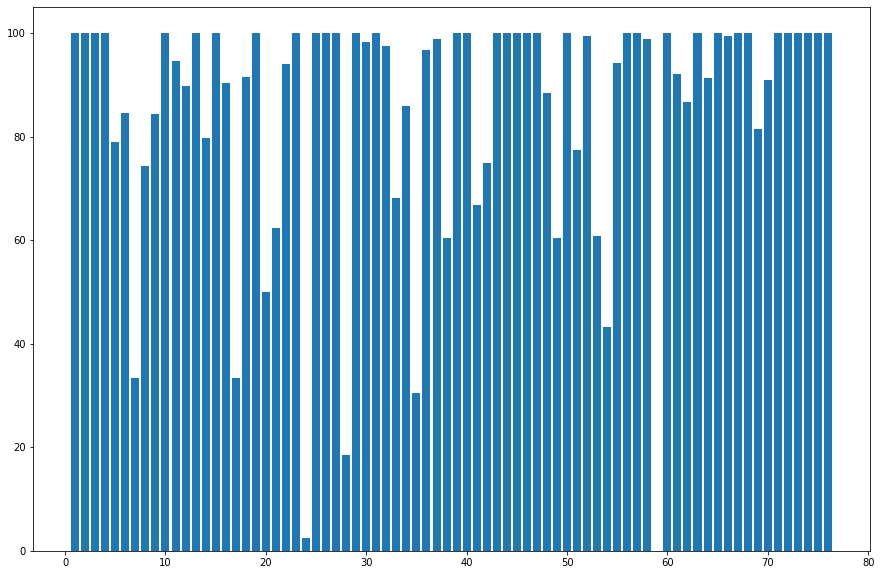

In [21]:
classDisribution(small_model)

In [27]:
medium_model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=32, kernel_size=3, data_format='channels_last', input_shape=(100,100,3)),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Conv2D(filters=64, kernel_size=3, input_shape=(100,100,3)),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Conv2D(filters=64, kernel_size=3, input_shape=(100,100,3)),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Conv2D(filters=128, kernel_size=3, input_shape=(100,100,3)),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units = 1024),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dense(units=76),
    tf.keras.layers.Activation('softmax'),
])
medium_model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

In [28]:
checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath='76_class_models/medium_model.hdf5', monitor='val_loss', verbose=1, save_best_only=True)
learningRateDecay = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1, min_lr=0.00001)

In [29]:
history = medium_model.fit(train_gen, steps_per_epoch=135, epochs=40, callbacks=[checkpointer, learningRateDecay], validation_data=test_gen, verbose=1)

Epoch 1/40
135/135 [==============================] - ETA: 0s - loss: 2.0136 - accuracy: 0.4897
Epoch 00001: val_loss improved from inf to 0.65409, saving model to 76_class_models/medium_model.hdf5
135/135 [==============================] - 13s 97ms/step - loss: 2.0136 - accuracy: 0.4897 - val_loss: 0.6541 - val_accuracy: 0.8261 - lr: 0.0010
Epoch 2/40
135/135 [==============================] - ETA: 0s - loss: 0.4375 - accuracy: 0.8932
Epoch 00002: val_loss improved from 0.65409 to 0.31975, saving model to 76_class_models/medium_model.hdf5
135/135 [==============================] - 13s 98ms/step - loss: 0.4375 - accuracy: 0.8932 - val_loss: 0.3198 - val_accuracy: 0.9232 - lr: 0.0010
Epoch 3/40
135/135 [==============================] - ETA: 0s - loss: 0.2268 - accuracy: 0.9480
Epoch 00003: val_loss improved from 0.31975 to 0.22362, saving model to 76_class_models/medium_model.hdf5
135/135 [==============================] - 14s 101ms/step - loss: 0.2268 - accuracy: 0.9480 - val_loss: 0.

In [30]:
medium_model = tf.keras.models.load_model('76_class_models/medium_model.hdf5')
medium_model.evaluate(test_gen)

52/52 [==============================] - 5s 96ms/step - loss: 0.1783 - accuracy: 0.9684


[0.17829005420207977, 0.9683833122253418]

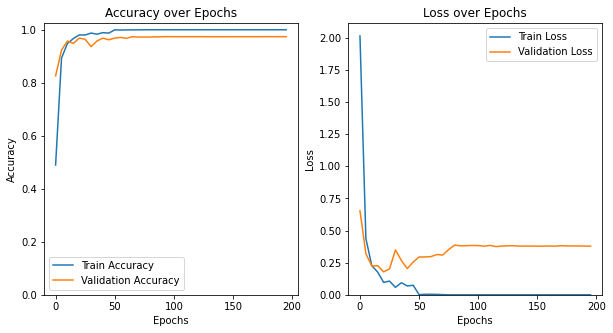

In [31]:
plotData(history)

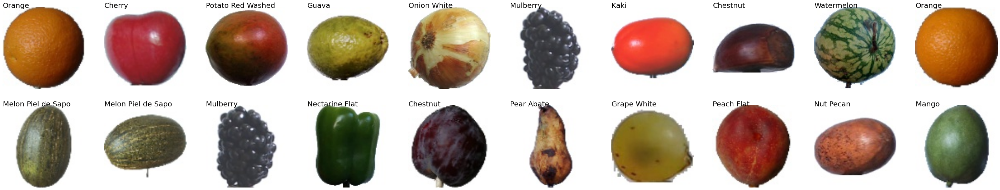

In [32]:
visuallyInspect(medium_model)

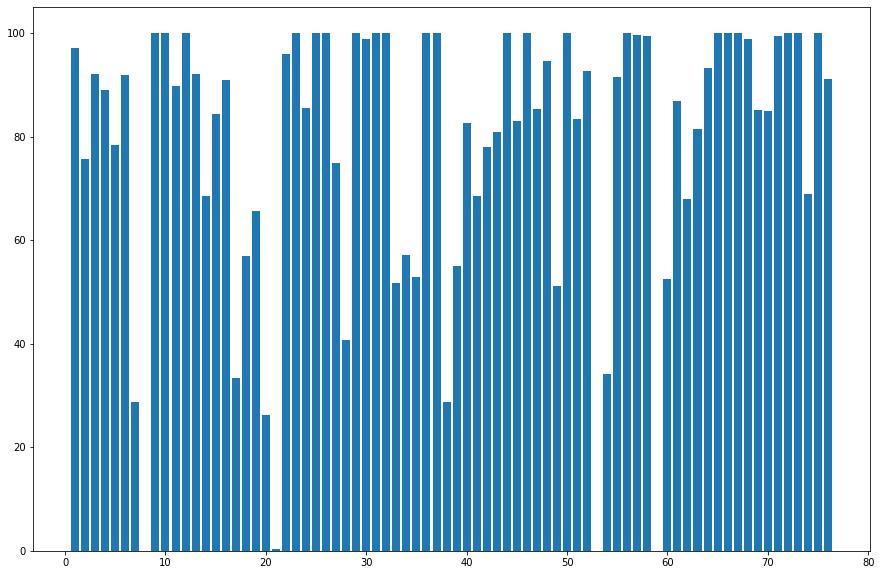

In [33]:
classDisribution(medium_model)

In [34]:
large_model = tf.keras.models.Sequential([
    # convolutional layer 1 made of 2 convolutions and maxpool
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding='same', data_format='channels_last', input_shape=(100,100,3)),
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    # convoltional layer 2 
    tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding='same',activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    # convoltional layer 3
    tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding='valid', activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    # convoltional layer 4
    tf.keras.layers.Conv2D(filters=256, kernel_size=3, padding='valid', activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    # Fully Connected Network formed and evaluated after convoltional layers
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=1024, activation='relu'),
    tf.keras.layers.Dense(units=512, activation='relu'),
    tf.keras.layers.Dense(units=76, activation='softmax')
])
large_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

In [35]:
checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath='76_class_models/large_model.hdf5', monitor='val_loss', verbose=1, save_best_only=True)
learningRateDecay = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1, min_lr=0.00001)

In [36]:
history = large_model.fit(train_gen, steps_per_epoch=135, epochs=40, callbacks=[checkpointer, learningRateDecay], validation_data=test_gen, verbose=1)

Epoch 1/40
135/135 [==============================] - ETA: 0s - loss: 3.2209 - accuracy: 0.2159
Epoch 00001: val_loss improved from inf to 1.47398, saving model to 76_class_models/large_model.hdf5
135/135 [==============================] - 39s 290ms/step - loss: 3.2209 - accuracy: 0.2159 - val_loss: 1.4740 - val_accuracy: 0.6091 - lr: 0.0010
Epoch 2/40
135/135 [==============================] - ETA: 0s - loss: 0.7159 - accuracy: 0.8090
Epoch 00002: val_loss improved from 1.47398 to 1.27314, saving model to 76_class_models/large_model.hdf5
135/135 [==============================] - 39s 287ms/step - loss: 0.7159 - accuracy: 0.8090 - val_loss: 1.2731 - val_accuracy: 0.6752 - lr: 0.0010
Epoch 3/40
135/135 [==============================] - ETA: 0s - loss: 0.3422 - accuracy: 0.9200
Epoch 00003: val_loss improved from 1.27314 to 0.23850, saving model to 76_class_models/large_model.hdf5
135/135 [==============================] - 40s 294ms/step - loss: 0.3422 - accuracy: 0.9200 - val_loss: 0.2

In [42]:
large_model = tf.keras.models.load_model('76_class_models/large_model.hdf5')
large_model.evaluate(test_gen)

52/52 [==============================] - 7s 126ms/step - loss: 0.2385 - accuracy: 0.9426


[0.2385040521621704, 0.9426336288452148]

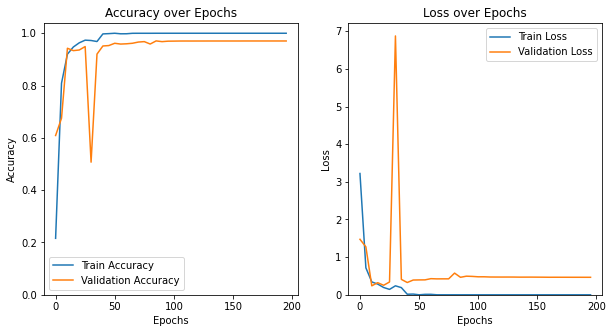

In [38]:
plotData(history)

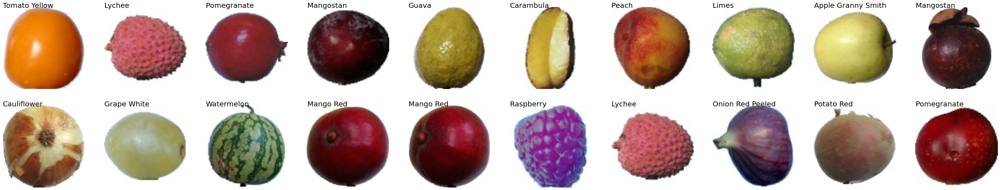

In [39]:
visuallyInspect(large_model)

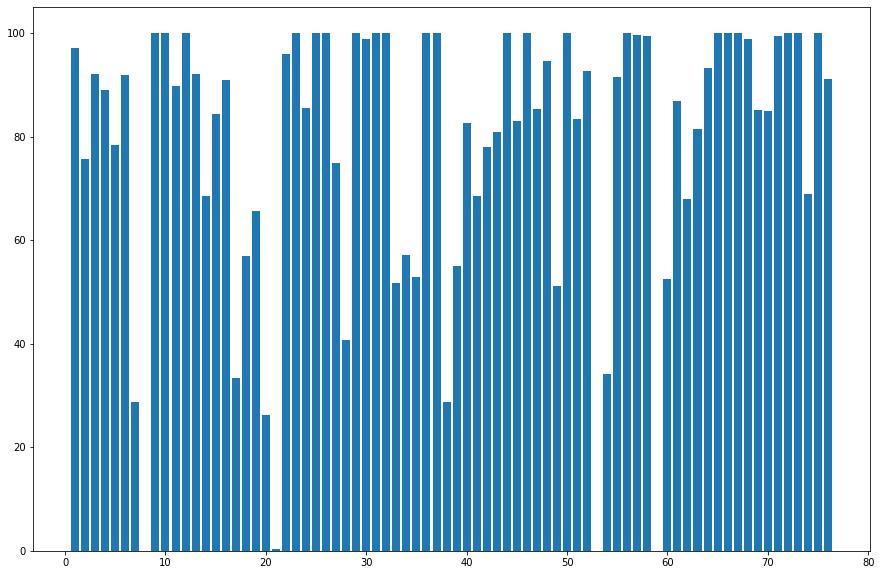

In [40]:
classDisribution(large_model)

In [41]:
dropout_model1 = tf.keras.models.Sequential([
    # convolutional layer 1 made of 2 convolutions and maxpool
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding='same', data_format='channels_last', input_shape=(100,100,3)),
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    # convoltional layer 2 
    tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding='same',activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    # convoltional layer 3
    tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding='valid', activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    # convoltional layer 4
    tf.keras.layers.Conv2D(filters=256, kernel_size=3, padding='valid', activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Dropout(0.3),
    # Fully Connected Network formed and evaluated after convoltional layers
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=1024, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(units=512, activation='relu'),
    tf.keras.layers.Dense(units=76, activation='softmax')
])
dropout_model1.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

In [43]:
checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath='76_class_models/dropout_model1.hdf5', monitor='val_loss', verbose=1, save_best_only=True)
learningRateDecay = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1, min_lr=0.00001)

In [44]:
history = dropout_model1.fit(train_gen, steps_per_epoch=135, epochs=40, callbacks=[checkpointer, learningRateDecay], validation_data=test_gen, verbose=1)

Epoch 1/40
135/135 [==============================] - ETA: 0s - loss: 2.9862 - accuracy: 0.2878
Epoch 00001: val_loss improved from inf to 1.40074, saving model to 76_class_models/dropout_model1.hdf5
135/135 [==============================] - 37s 272ms/step - loss: 2.9862 - accuracy: 0.2878 - val_loss: 1.4007 - val_accuracy: 0.6137 - lr: 0.0010
Epoch 2/40
135/135 [==============================] - ETA: 0s - loss: 0.6977 - accuracy: 0.7990
Epoch 00002: val_loss improved from 1.40074 to 0.58401, saving model to 76_class_models/dropout_model1.hdf5
135/135 [==============================] - 37s 272ms/step - loss: 0.6977 - accuracy: 0.7990 - val_loss: 0.5840 - val_accuracy: 0.8390 - lr: 0.0010
Epoch 3/40
135/135 [==============================] - ETA: 0s - loss: 0.2668 - accuracy: 0.9277
Epoch 00003: val_loss did not improve from 0.58401
135/135 [==============================] - 37s 270ms/step - loss: 0.2668 - accuracy: 0.9277 - val_loss: 0.7562 - val_accuracy: 0.8501 - lr: 0.0010
Epoch 4/

In [45]:
dropout_model1 = tf.keras.models.load_model('76_class_models/dropout_model1.hdf5')
dropout_model1.evaluate(test_gen)

52/52 [==============================] - 6s 118ms/step - loss: 0.2744 - accuracy: 0.9540


[0.2744367718696594, 0.9540417194366455]

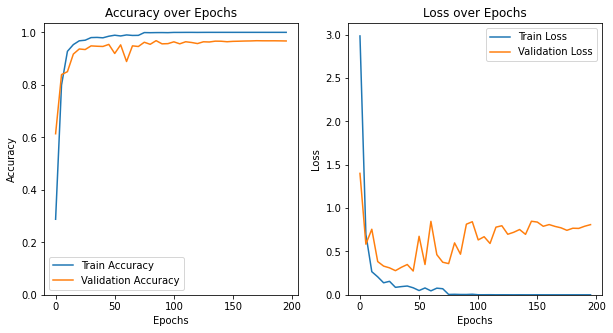

In [46]:
plotData(history)

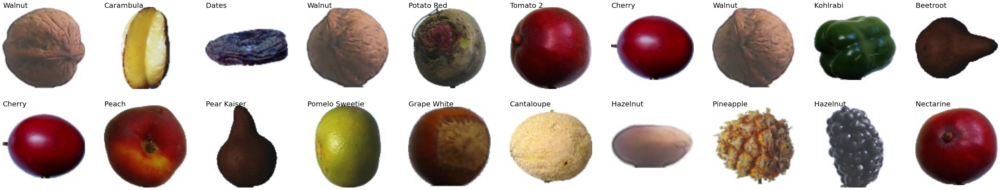

In [47]:
visuallyInspect(dropout_model1)

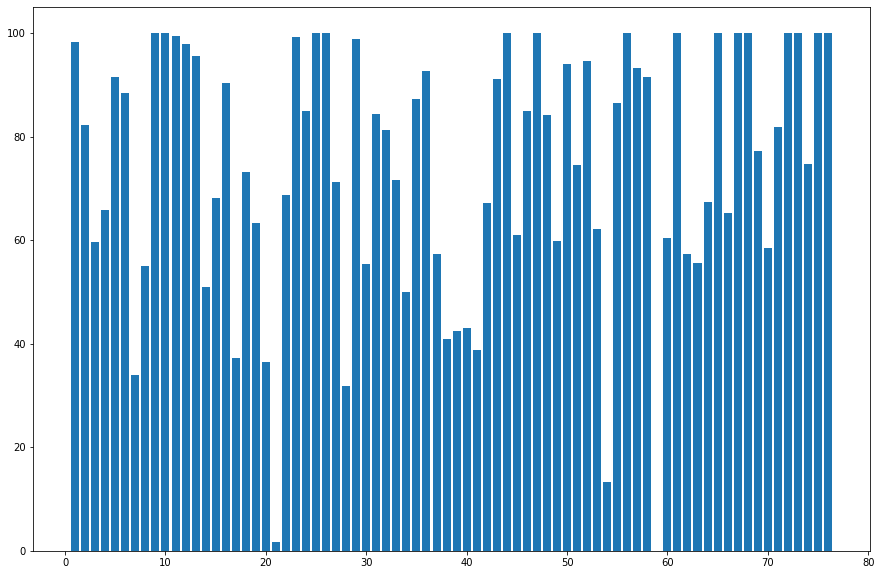

In [48]:
classDisribution(dropout_model1)

In [31]:
dropout_model2 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters = 16, kernel_size = 2,input_shape=(100,100,3),padding='same'),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPooling2D(pool_size=2),

    tf.keras.layers.Conv2D(filters = 32,kernel_size = 2,activation= 'relu',padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=2),

    tf.keras.layers.Conv2D(filters = 64,kernel_size = 2,activation= 'relu',padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=2),

    tf.keras.layers.Conv2D(filters = 128,kernel_size = 2,activation= 'relu',padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=2),

    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(150),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Dense(76, activation = 'softmax')
])
dropout_model2.compile(loss='categorical_crossentropy',optimizer='rmsprop', metrics=['accuracy'])

In [32]:
checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath='76_class_models/dropout_model2.hdf5', monitor='val_loss', verbose=1, save_best_only=True)
learningRateDecay = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1, min_lr=0.00001)

In [33]:
history = dropout_model2.fit(train_gen, steps_per_epoch=135, epochs=40, callbacks=[checkpointer, learningRateDecay], validation_data=test_gen, verbose=1, shuffle=True)

Epoch 1/40
134/135 [============================>.] - ETA: 0s - loss: 2.6083 - accuracy: 0.3382
Epoch 00001: val_loss improved from inf to 1.08058, saving model to 76_class_models/dropout_model2.hdf5
135/135 [==============================] - 12s 86ms/step - loss: 2.5983 - accuracy: 0.3402 - val_loss: 1.0806 - val_accuracy: 0.7181 - lr: 0.0010
Epoch 2/40
135/135 [==============================] - ETA: 0s - loss: 0.8063 - accuracy: 0.7491
Epoch 00002: val_loss improved from 1.08058 to 0.41704, saving model to 76_class_models/dropout_model2.hdf5
135/135 [==============================] - 11s 84ms/step - loss: 0.8063 - accuracy: 0.7491 - val_loss: 0.4170 - val_accuracy: 0.8871 - lr: 0.0010
Epoch 3/40
135/135 [==============================] - ETA: 0s - loss: 0.3568 - accuracy: 0.8867
Epoch 00003: val_loss improved from 0.41704 to 0.27499, saving model to 76_class_models/dropout_model2.hdf5
135/135 [==============================] - 12s 88ms/step - loss: 0.3568 - accuracy: 0.8867 - val_los

In [34]:
dropout_model2 = tf.keras.models.load_model('76_class_models/dropout_model2.hdf5')
dropout_model2.evaluate(test_gen)

52/52 [==============================] - 5s 91ms/step - loss: 0.1024 - accuracy: 0.9838


[0.10242766886949539, 0.9838331341743469]

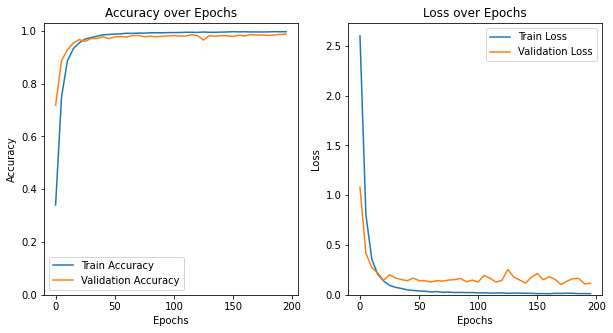

In [35]:
plotData(history)

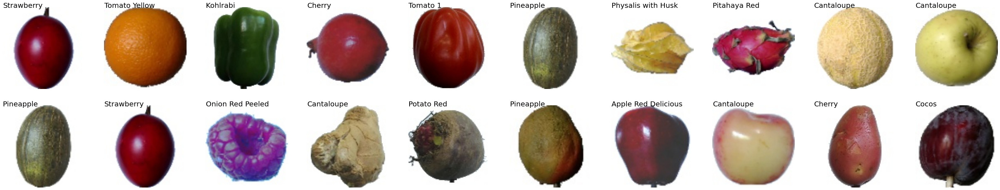

In [38]:
visuallyInspect(dropout_model2)

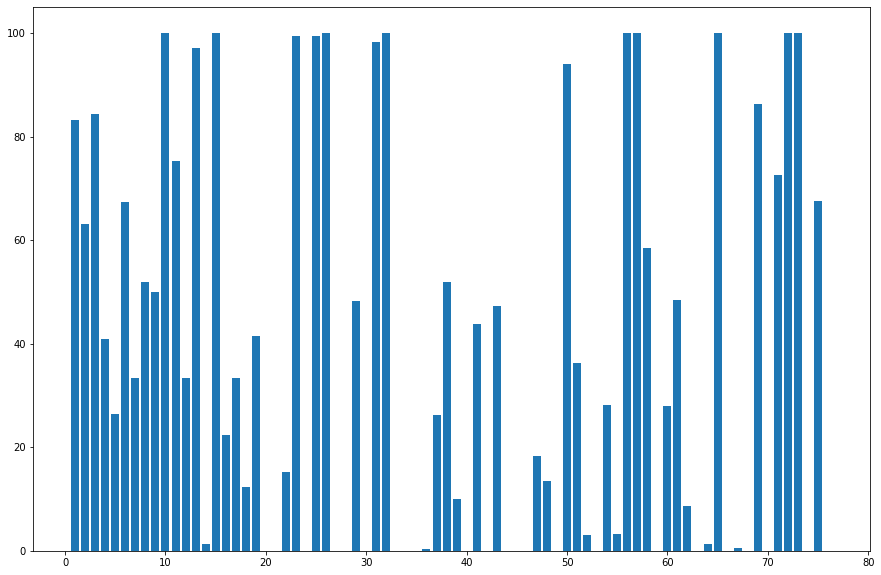

In [39]:
classDisribution(dropout_model2)

In [40]:
model = tf.keras.models.load_model('76_class_models/dropout_model2.hdf5')
dropout_model = tf.keras.models.load_model('76_class_models/dropout_model1.hdf5')
large_model = tf.keras.models.load_model('76_class_models/large_model.hdf5')
medium_model = tf.keras.models.load_model('76_class_models/medium_model.hdf5')
small_model = tf.keras.models.load_model('76_class_models/small_model.hdf5')

In [41]:
model.evaluate(test_gen)
dropout_model.evaluate(test_gen)
large_model.evaluate(test_gen)
medium_model.evaluate(test_gen)
small_model.evaluate(test_gen)

52/52 [==============================] - 5s 91ms/step - loss: 0.1663 - accuracy: 0.9731


[0.16634564101696014, 0.9730769395828247]

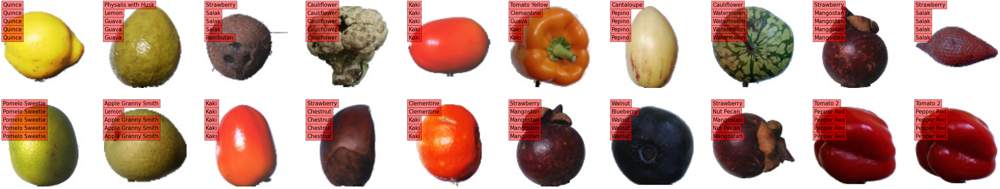

In [42]:
uploads = random.choices(os.listdir(test_dir), k = 20)
size = len(uploads)
fig = plt.figure(figsize=(50,50))
for i, file in enumerate(uploads):
    path = test_dir + file
    path = path +'/'+ random.choice(os.listdir(path))
    img = tf.keras.preprocessing.image.load_img(path, target_size=(100, 100))
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    saved = mpimg.imread(path)
    fig.add_subplot(10,10,i+1)
    plt.imshow(saved)
  
    plt.axis('off')
    pred1 = model.predict(img)
    pred2 = small_model.predict(img)
    pred3 = dropout_model.predict(img)
    pred4 = medium_model.predict(img)
    pred5 = large_model.predict(img)
    
    plt.text(x=0, y=0, s=classes[np.argmax(pred1)],fontsize=15, bbox=dict(facecolor='red', alpha=0.5))
    plt.text(x=0, y=10, s=classes[np.argmax(pred2)],fontsize=15, bbox=dict(facecolor='red', alpha=0.5))
    plt.text(x=0, y=20, s=classes[np.argmax(pred3)],fontsize=15, bbox=dict(facecolor='red', alpha=0.5))
    plt.text(x=0, y=30, s=classes[np.argmax(pred4)],fontsize=15, bbox=dict(facecolor='red', alpha=0.5))
    plt.text(x=0, y=40, s=classes[np.argmax(pred5)],fontsize=15, bbox=dict(facecolor='red', alpha=0.5))